In [1]:
import requests
from dotenv import load_dotenv
import os 
import pandas as pd
import numpy as np
import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation
import json

In [2]:
load_dotenv()

True

In [3]:
alpaca_api_key = os.getenv("APCA_API_KEY")
alpaca_secret_key = os.getenv("APCA_API_SECRET")
# Create the Alpaca API object
# YOUR CODE HERE!
alpaca = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version= "v2")

In [4]:
print(f"Alpaca Key type: {type(alpaca_api_key)}")
print(f"Alpca Secret Key type: {type(alpaca_secret_key)}")

Alpaca Key type: <class 'str'>
Alpca Secret Key type: <class 'str'>


In [5]:
current_date = pd.Timestamp("2019-10-30", tz="America/New_York").isoformat()

tickers = ["FB", "AAPL", "AMZN", "NFLX", "GOOGL"]

timeframe = "1D"

In [6]:
df_ticker = alpaca.get_barset(
    tickers,
    timeframe,
    start=current_date
).df

df_ticker

AAPL                                         \
                             open     high       low    close     volume   
2019-10-30 00:00:00-04:00  244.76  245.300  241.2100  243.290   25443913   
2019-10-31 00:00:00-04:00  247.24  249.170  237.2600  248.840   29688327   
2019-11-01 00:00:00-04:00  249.54  255.930  249.1600  255.840   33985331   
2019-11-04 00:00:00-05:00  257.33  257.845  255.3800  257.480   23618001   
2019-11-05 00:00:00-05:00  257.05  258.190  256.3200  257.150   17738372   
...                           ...      ...       ...      ...        ...   
2020-11-02 00:00:00-05:00  109.11  110.680  107.3200  108.770  106260834   
2020-11-03 00:00:00-05:00  109.66  111.470  108.7300  110.375   93660131   
2020-11-04 00:00:00-05:00  114.14  115.590  112.3500  114.940  114505478   
2020-11-05 00:00:00-05:00  117.99  119.620  116.8686  118.990  107993032   
2020-11-06 00:00:00-05:00  118.32  119.200  116.1300  118.685   99225280   

                              AMZN                                           \
                              open      high        low      close   volume   
2019-10-30 00:00:00-04:00  1760.24  1782.380  1759.1150  1780.0000  2194972   
2019-10-31 00:00:00-04:00  1775.99  1792.000  1771.4753  1777.1431  2375710   
2019-11-01 00:00:00-04:00  1788.01  1797.445  1785.2790  1791.4700  2375327   
2019-11-04 00:00:00-05:00  1801.50  1815.060  1801.0100  1805.2700  2513437   
2019-11-05 00:00:00-05:00  1809.16  1810.250  1794.0000  1801.7000  1650756   
...                            ...       ...        ...        ...      ...   
2020-11-02 00:00:00-05:00  3061.74  3079.705  2950.3950  3004.4800  6469197   
2020-11-03 00:00:00-05:00  3018.53  3074.900  2980.9800  3046.2500  4399819   
2020-11-04 00:00:00-05:00  3159.99  3244.850  3139.7300  3241.1600  5771116   
2020-11-05 00:00:00-05:00  3319.97  3366.800  3288.8800  3322.0000  4939019   
2020-11-06 00:00:00-05:00  3304.64  3322.000  3232.0000  3310.4100  4119260   

                           ...      GOOGL                                \
                           ...       open       high       low    close   
2019-10-30 00:00:00-04:00  ...  1255.1500  1268.0150  1250.650  1260.62   
2019-10-31 00:00:00-04:00  ...  1260.0000  1266.5157  1249.480  1258.79   
2019-11-01 00:00:00-04:00  ...  1265.8000  1273.0000  1259.710  1272.98   
2019-11-04 00:00:00-05:00  ...  1276.1100  1292.5000  1276.110  1289.61   
2019-11-05 00:00:00-05:00  ...  1291.2000  1297.2400  1289.380  1291.45   
...                        ...        ...        ...       ...      ...   
2020-11-02 00:00:00-05:00  ...  1623.5400  1658.2400  1614.240  1623.17   
2020-11-03 00:00:00-05:00  ...  1630.7600  1659.0000  1612.108  1643.49   
2020-11-04 00:00:00-05:00  ...  1705.5803  1770.0300  1703.000  1747.04   
2020-11-05 00:00:00-05:00  ...  1770.4500  1791.8180  1741.030  1762.61   
2020-11-06 00:00:00-05:00  ...  1751.4800  1768.4950  1736.680  1759.40   

                                      NFLX                              \
                            volume    open      high     low     close   
2019-10-30 00:00:00-04:00  1216120  284.34  293.4900  283.00  291.4500   
2019-10-31 00:00:00-04:00  1048321  291.00  291.4500  284.78  287.4400   
2019-11-01 00:00:00-04:00  1074648  288.70  289.1200  283.02  286.9750   
2019-11-04 00:00:00-05:00  1178212  288.00  295.3900  287.16  292.9900   
2019-11-05 00:00:00-05:00   985981  289.99  291.1900  286.31  288.0300   
...                            ...     ...       ...     ...       ...   
2020-11-02 00:00:00-05:00  1869231  478.90  486.3000  475.00  484.1201   
2020-11-03 00:00:00-05:00  1230686  484.93  495.3050  478.76  487.2200   
2020-11-04 00:00:00-05:00  2900951  495.50  507.7300  493.98  496.9600   
2020-11-05 00:00:00-05:00  1555143  506.56  518.7337  503.45  513.6500   
2020-11-06 00:00:00-05:00  1155374  515.00  515.2100  502.51  514.8600   

                                    
                            volume  

In [7]:
df_closing_prices = pd.DataFrame()

for ticker in tickers:
    df_closing_prices[ticker] = df_ticker[ticker]["close"]
# Preview DataFrame
# YOUR CODE HERE!
df_closing_prices

,FB,AAPL,AMZN,NFLX,GOOGL
2019-10-30 00:00:00-04:00,188.180,243.290,1780.0000,291.4500,1260.62
2019-10-31 00:00:00-04:00,191.680,248.840,1777.1431,287.4400,1258.79
2019-11-01 00:00:00-04:00,193.690,255.840,1791.4700,286.9750,1272.98
2019-11-04 00:00:00-05:00,194.720,257.480,1805.2700,292.9900,1289.61
2019-11-05 00:00:00-05:00,194.330,257.150,1801.7000,288.0300,1291.45
...,...,...,...,...,...
2020-11-02 00:00:00-05:00,261.480,108.770,3004.4800,484.1201,1623.17
2020-11-03 00:00:00-05:00,265.080,110.375,3046.2500,487.2200,1643.49
2020-11-04 00:00:00-05:00,287.450,114.940,3241.1600,496.9600,1747.04
2020-11-05 00:00:00-05:00,294.715,118.990,3322.0000,513.6500,1762.61


In [8]:
df_closing_prices.index = df_closing_prices.index.date

In [9]:
df_closing_prices

,FB,AAPL,AMZN,NFLX,GOOGL
2019-10-30,188.180,243.290,1780.0000,291.4500,1260.62
2019-10-31,191.680,248.840,1777.1431,287.4400,1258.79
2019-11-01,193.690,255.840,1791.4700,286.9750,1272.98
2019-11-04,194.720,257.480,1805.2700,292.9900,1289.61
2019-11-05,194.330,257.150,1801.7000,288.0300,1291.45
...,...,...,...,...,...
2020-11-02,261.480,108.770,3004.4800,484.1201,1623.17
2020-11-03,265.080,110.375,3046.2500,487.2200,1643.49
2020-11-04,287.450,114.940,3241.1600,496.9600,1747.04
2020-11-05,294.715,118.990,3322.0000,513.6500,1762.61


In [10]:
df_current_price = df_closing_prices.tail(1)

In [11]:
df_current_price

,FB,AAPL,AMZN,NFLX,GOOGL
2020-11-06,293.41,118.685,3310.41,514.86,1759.4


In [12]:
fb_current_price = (df_current_price["FB"])
aapl_current_price = (df_current_price["AAPL"])
amzn_current_price = (df_current_price["AMZN"])
nflx_current_price = (df_current_price["NFLX"])
gogl_current_price = (df_current_price["GOOGL"])

In [13]:
print(f"Current Faceboook closing prices: ${float(fb_current_price)}")
print(f"Current Apple closing prices: ${float(aapl_current_price)}")
print(f"Current Amazon closing prices: ${float(amzn_current_price)}")
print(f"Current Netflix closing prices: ${float(nflx_current_price)}")
print(f"Current Google closing prices: ${float(gogl_current_price)}")

Current Faceboook closing prices: $293.41
Current Apple closing prices: $118.685
Current Amazon closing prices: $3310.41
Current Netflix closing prices: $514.86
Current Google closing prices: $1759.4


In [14]:
current_changes = df_closing_prices.pct_change().dropna()

[0.2, 0.2, 0.2, 0.2, 0.2]

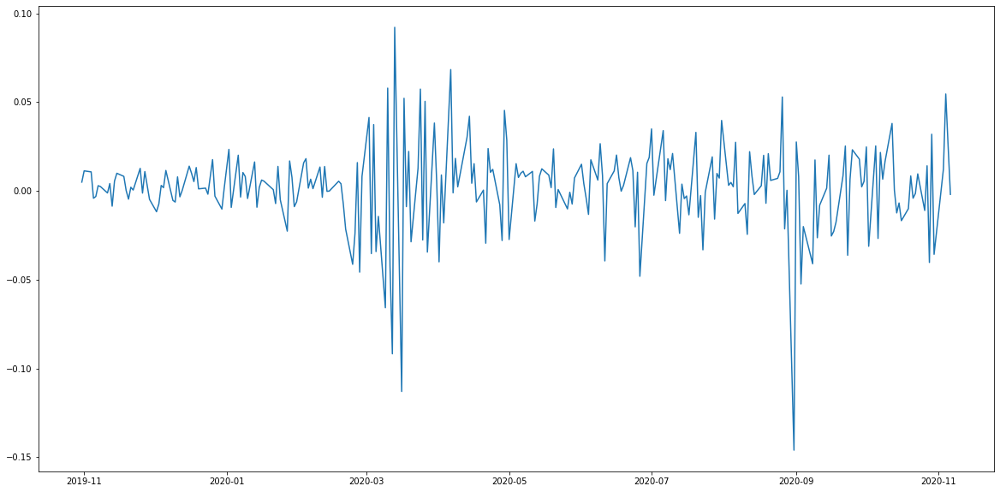

In [15]:

FACE = float(input("ENTER WEIGHT OF Facebook"))
APPLE = float(input("ENTER WEIGHT OF Apple"))
AMAZON = float(input("ENTER WEIGHT OF Amazon"))
NETFL = float(input("ENTER WEIGHT OF Netflix"))
GOOGL= float(input("ENTER WEIGHT OF Google"))

if FACE + APPLE + AMAZON + NETFL + GOOGL == 1:
    portfolio_weights = [FACE, APPLE, AMAZON, NETFL, GOOGL]

    portfolio_return = current_changes.dot(portfolio_weights)

    portfolio_return.plot(figsize = (20, 10))

else:
    print("Adjust your inputs. Total weight must equal 1")

portfolio_weights

In [16]:
import os
import requests
import pandas as pd
from dotenv import load_dotenv
import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation
import json

%matplotlib inline

In [17]:
load_dotenv()

True

In [18]:
start_date = pd.Timestamp('2019-10-29', tz='America/New_York').isoformat()
end_date = pd.Timestamp('2020-10-31', tz='America/New_York').isoformat()

In [19]:
tickers = ["FB", "AAPL", "AMZN", "NFLX", "GOOGL"]

df_stock_data = alpaca.get_barset(
    tickers,
    timeframe,
    start=start_date,
    end=end_date
).df
# Display sample data
df_stock_data.head()

AAPL                                        AMZN  \
                             open     high     low   close    volume     open   
2019-10-29 00:00:00-04:00  248.97  249.750  242.57  243.29  32725739  1775.00   
2019-10-30 00:00:00-04:00  244.76  245.300  241.21  243.29  25443913  1760.24   
2019-10-31 00:00:00-04:00  247.24  249.170  237.26  248.84  29688327  1775.99   
2019-11-01 00:00:00-04:00  249.54  255.930  249.16  255.84  33985331  1788.01   
2019-11-04 00:00:00-05:00  257.33  257.845  255.38  257.48  23618001  1801.50   

                                                                    ...  \
                               high        low      close   volume  ...   
2019-10-29 00:00:00-04:00  1777.000  1755.8100  1763.0400  2063458  ...   
2019-10-30 00:00:00-04:00  1782.380  1759.1150  1780.0000  2194972  ...   
2019-10-31 00:00:00-04:00  1792.000  1771.4753  1777.1431  2375710  ...   
2019-11-01 00:00:00-04:00  1797.445  1785.2790  1791.4700  2375327  ...   
2019-11-04 00:00:00-05:00  1815.060  1801.0100  1805.2700  2513437  ...   

                             GOOGL                                        \
                              open       high      low    close   volume   
2019-10-29 00:00:00-04:00  1276.00  1280.8000  1255.61  1260.67  2350512   
2019-10-30 00:00:00-04:00  1255.15  1268.0150  1250.65  1260.62  1216120   
2019-10-31 00:00:00-04:00  1260.00  1266.5157  1249.48  1258.79  1048321   
2019-11-01 00:00:00-04:00  1265.80  1273.0000  1259.71  1272.98  1074648   
2019-11-04 00:00:00-05:00  1276.11  1292.5000  1276.11  1289.61  1178212   

                             NFLX                                     
                             open    high      low    close   volume  
2019-10-29 00:00:00-04:00  281.87  284.41  277.545  281.200  4050973  
2019-10-30 00:00:00-04:00  284.34  293.49  283.000  291.450  8937016  
2019-10-31 00:00:00-04:00  291.00  291.45  284.780  287.440  4622291  
2019-11-01 00:00:00-04:00  288.70  289.12  283.020  286.975  5129507  
2019-11-04 00:00:00-05:00  288.00  295.39  287.160  292.990  5110430  

[5 rows x 25 columns]

In [20]:
portfolio_forecast = MCSimulation(
    portfolio_data = df_stock_data,
    weights = [.2,.2,.2,.2,.2],
    num_simulation = 500,
    num_trading_days = 252*10
)


In [21]:
portfolio_forecast.portfolio_data.head()

AAPL                                     \
                             open     high     low   close    volume   
2019-10-29 00:00:00-04:00  248.97  249.750  242.57  243.29  32725739   
2019-10-30 00:00:00-04:00  244.76  245.300  241.21  243.29  25443913   
2019-10-31 00:00:00-04:00  247.24  249.170  237.26  248.84  29688327   
2019-11-01 00:00:00-04:00  249.54  255.930  249.16  255.84  33985331   
2019-11-04 00:00:00-05:00  257.33  257.845  255.38  257.48  23618001   

                                           AMZN                       \
                          daily_return     open      high        low   
2019-10-29 00:00:00-04:00          NaN  1775.00  1777.000  1755.8100   
2019-10-30 00:00:00-04:00     0.000000  1760.24  1782.380  1759.1150   
2019-10-31 00:00:00-04:00     0.022812  1775.99  1792.000  1771.4753   
2019-11-01 00:00:00-04:00     0.028131  1788.01  1797.445  1785.2790   
2019-11-04 00:00:00-05:00     0.006410  1801.50  1815.060  1801.0100   

                                      ...    GOOGL                    \
                               close  ...      low    close   volume   
2019-10-29 00:00:00-04:00  1763.0400  ...  1255.61  1260.67  2350512   
2019-10-30 00:00:00-04:00  1780.0000  ...  1250.65  1260.62  1216120   
2019-10-31 00:00:00-04:00  1777.1431  ...  1249.48  1258.79  1048321   
2019-11-01 00:00:00-04:00  1791.4700  ...  1259.71  1272.98  1074648   
2019-11-04 00:00:00-05:00  1805.2700  ...  1276.11  1289.61  1178212   

                                          NFLX                            \
                          daily_return    open    high      low    close   
2019-10-29 00:00:00-04:00          NaN  281.87  284.41  277.545  281.200   
2019-10-30 00:00:00-04:00    -0.000040  284.34  293.49  283.000  291.450   
2019-10-31 00:00:00-04:00    -0.001452  291.00  291.45  284.780  287.440   
2019-11-01 00:00:00-04:00     0.011273  288.70  289.12  283.020  286.975   
2019-11-04 00:00:00-05:00     0.013064  288.00  295.39  287.160  292.990   

                                                 
                            volume daily_return  
2019-10-29 00:00:00-04:00  4050973          NaN  
2019-10-30 00:00:00-04:00  8937016     0.036451  
2019-10-31 00:00:00-04:00  4622291    -0.013759  
2019-11-01 00:00:00-04:00  5129507    -0.001618  
2019-11-04 00:00:00-05:00  5110430     0.020960  

[5 rows x 30 columns]

In [22]:
portfolio_forecast.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.002655,0.975851,1.004819,0.994114,1.002874,0.992101,1.001729,0.986319,1.013009,0.985262,...,1.003484,1.005466,1.008575,1.006793,1.006485,1.004231,0.980943,1.003721,0.997020,1.020886
2,1.005896,0.958790,1.036478,0.999526,0.995635,0.982946,1.028881,1.018574,1.004483,0.959138,...,1.003188,1.002018,0.999271,1.058372,0.980999,1.015798,0.958308,1.005988,1.006715,1.006904
3,0.994456,0.975671,1.033137,1.009002,1.003247,0.976977,1.040895,1.026912,1.002875,0.959321,...,0.999879,1.017780,1.040542,1.072409,0.980773,1.005634,0.975872,0.995484,1.018760,1.015804
4,1.008136,0.969566,1.036920,1.006887,1.018975,0.964203,1.039479,1.023109,1.023951,0.952457,...,1.008110,1.038474,1.025100,1.094724,0.989510,1.005653,0.979624,0.989591,1.013152,1.022129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2516,46.469848,32.108190,37.823915,15.599112,41.616940,16.247895,39.661996,71.501557,57.466169,21.303993,...,12.943585,33.532054,16.677691,44.891435,27.654792,20.072426,21.705065,34.231315,29.702328,22.032733
2517,47.377898,31.762665,39.172257,15.374543,42.420778,16.567802,40.256988,71.003012,58.216996,21.286912,...,12.951009,34.538509,16.587499,44.957383,27.317136,19.787293,21.443487,33.947885,28.737179,22.234992
2518,47.828773,32.183793,38.808686,15.537457,43.059274,16.463883,41.066743,73.210059,57.576449,20.666965,...,12.564846,34.769218,16.450220,45.219814,27.442239,19.621426,21.068500,33.947520,29.091707,22.135992
2519,47.952823,32.033818,38.918472,15.199326,42.154736,16.757625,40.057976,72.368266,57.658203,19.649236,...,12.432146,34.838625,16.262065,44.173172,27.446788,19.537180,20.878002,33.239804,29.242234,21.813755


Text(0, 0.5, 'Cumulative Return')

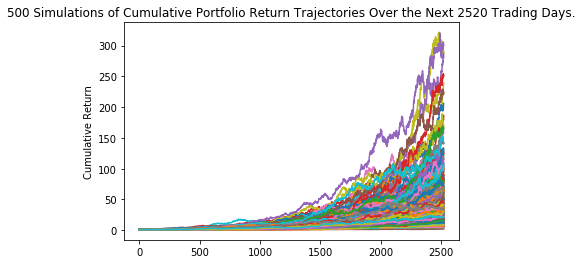

In [23]:
line_plot = portfolio_forecast.plot_simulation()
line_plot.set_ylabel("Cumulative Return")